# Part 1 DATA IFORMATION

In [242]:
import shutil
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import numpy as np

In [243]:
import kagglehub
path = kagglehub.dataset_download("arunjangir245/boston-housing-dataset")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/boston-housing-dataset


In [244]:
csv_file = "/kaggle/input/boston-housing-dataset/BostonHousing.csv"
df = pd.read_csv(csv_file)
df.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


crim: Per capita crime rate by town.


zn: Proportion of large residential lots (over 25,000 sq. ft.).


indus: Proportion of non-retail business acres per town.



Chas: Binary variable indicating if the property is near Charles River (1 for yes, 0 for no).



nox: Concentration of nitrogen oxides in the air.



rm: Average number of rooms per dwelling.



age: Proportion of old owner-occupied units built before 1940.


dis: Weighted distances to Boston employment centers.


rad: Index of accessibility to radial highways.



tax: Property tax rate per $10,000.

In [245]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   crim     506 non-null    float64
 1   zn       506 non-null    float64
 2   indus    506 non-null    float64
 3   chas     506 non-null    int64  
 4   nox      506 non-null    float64
 5   rm       501 non-null    float64
 6   age      506 non-null    float64
 7   dis      506 non-null    float64
 8   rad      506 non-null    int64  
 9   tax      506 non-null    int64  
 10  ptratio  506 non-null    float64
 11  b        506 non-null    float64
 12  lstat    506 non-null    float64
 13  medv     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [246]:
path = kagglehub.dataset_download("ankkur13/boston-crime-data")
print("Path to dataset files:", path)
csv_file2 = "/root/.cache/kagglehub/datasets/ankkur13/boston-crime-data/versions/3/crime.csv"
df2 = pd.read_csv(csv_file2,encoding='latin-1')
df2.head()

Path to dataset files: /kaggle/input/boston-crime-data


/tmp/ipython-input-246-2958254607.py:4: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.



,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182080058,2403,Disorderly Conduct,DISTURBING THE PEACE,E18,495,NaN,2018-10-03 20:13:00,2018,10,Wednesday,20,Part Two,ARLINGTON ST,42.262608,-71.121186,"(42.26260773, -71.12118637)"
1,I182080053,3201,Property Lost,PROPERTY - LOST,D14,795,NaN,2018-08-30 20:00:00,2018,8,Thursday,20,Part Three,ALLSTON ST,42.352111,-71.135311,"(42.35211146, -71.13531147)"
2,I182080052,2647,Other,THREATS TO DO BODILY HARM,B2,329,NaN,2018-10-03 19:20:00,2018,10,Wednesday,19,Part Two,DEVON ST,42.308126,-71.076930,"(42.30812619, -71.07692974)"
3,I182080051,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,A1,92,NaN,2018-10-03 20:00:00,2018,10,Wednesday,20,Part One,CAMBRIDGE ST,42.359454,-71.059648,"(42.35945371, -71.05964817)"
4,I182080050,3122,Aircraft,AIRCRAFT INCIDENTS,A7,36,NaN,2018-10-03 20:49:00,2018,10,Wednesday,20,Part Three,PRESCOTT ST,42.375258,-71.024663,"(42.37525782, -71.02466343)"


In [247]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 327820 entries, 0 to 327819
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      327820 non-null  object 
 1   OFFENSE_CODE         327820 non-null  int64  
 2   OFFENSE_CODE_GROUP   327820 non-null  object 
 3   OFFENSE_DESCRIPTION  327820 non-null  object 
 4   DISTRICT             326046 non-null  object 
 5   REPORTING_AREA       327820 non-null  object 
 6   SHOOTING             1055 non-null    object 
 7   OCCURRED_ON_DATE     327820 non-null  object 
 8   YEAR                 327820 non-null  int64  
 9   MONTH                327820 non-null  int64  
 10  DAY_OF_WEEK          327820 non-null  object 
 11  HOUR                 327820 non-null  int64  
 12  UCR_PART             327727 non-null  object 
 13  STREET               316843 non-null  object 
 14  Lat                  307188 non-null  float64
 15  Long             

Mising Value

In [248]:
# missing value of BostonHounsing.csv file
missing_values_count1 = df.isnull().sum()
missing_values_count1

,0
crim,0
zn,0
indus,0
chas,0
nox,0
rm,5
age,0
dis,0
rad,0
tax,0


In [249]:
# missing value of crime.csv file
missing_values_count2 = df2.isnull().sum()
missing_values_count2

,0
INCIDENT_NUMBER,0
OFFENSE_CODE,0
OFFENSE_CODE_GROUP,0
OFFENSE_DESCRIPTION,0
DISTRICT,1774
REPORTING_AREA,0
SHOOTING,326765
OCCURRED_ON_DATE,0
YEAR,0
MONTH,0


percent_missing of BostonHousing.csv: 0.070582% 


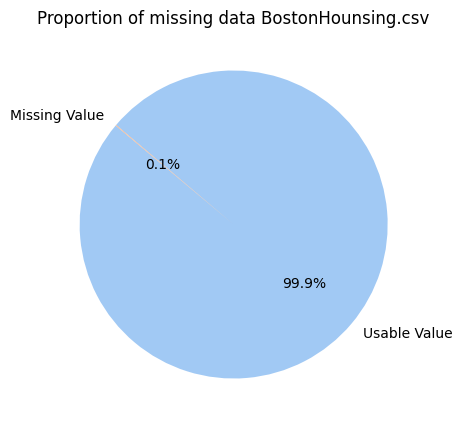

In [250]:
total_cells1 = np.prod(df.shape)
total_missing1 = missing_values_count1.sum()
percent_missing = (total_missing1/total_cells1) * 100
print("percent_missing of BostonHousing.csv: {:.6f}% ".format(percent_missing))

plt.figure(figsize=(16,5))
plt.pie([total_cells1 - total_missing1, total_missing1],
    labels=['Usable Value', 'Missing Value'],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("pastel")
)

plt.title("Proportion of missing data BostonHounsing.csv")
plt.show()

percent_missing of BostonHousing.csv: 6.83 %


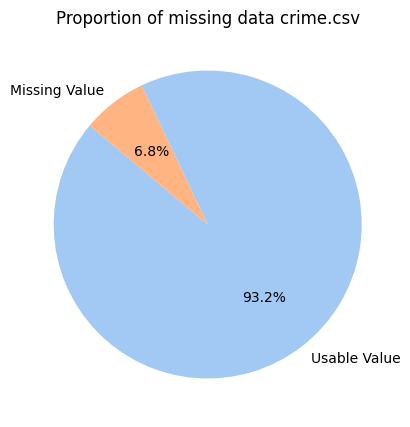

In [251]:
total_cells2 = np.prod(df2.shape)
total_missing2 = missing_values_count2.sum()
percent_missing2 = (total_missing2/total_cells2) * 100
print("percent_missing of BostonHousing.csv: {:.2f} %".format(percent_missing2))

plt.figure(figsize=(16,5))
plt.pie([total_cells2 - total_missing2, total_missing2],
    labels=['Usable Value', 'Missing Value'],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("pastel")
)

plt.title("Proportion of missing data crime.csv")
plt.show()

In [252]:
offense_code_unique = df2.OFFENSE_CODE_GROUP.nunique()
print("Number of unique values in OFFENSE_CODE_GROUP: {}".format(df2_unique))
print("\n")
df2.OFFENSE_CODE_GROUP.unique()

Number of unique values in OFFENSE_CODE_GROUP: 67




array(['Disorderly Conduct', 'Property Lost', 'Other',
       'Aggravated Assault', 'Aircraft', 'Vandalism',
       'Motor Vehicle Accident Response', 'Verbal Disputes',
       'Simple Assault', 'Towed', 'Auto Theft', 'Medical Assistance',
       'Investigate Person', 'Fire Related Reports', 'Larceny',
       'Investigate Property', 'Harassment', 'Robbery', 'Drug Violation',
       'Violations', 'Liquor Violation', 'Fraud', 'Warrant Arrests',
       'Recovered Stolen Property', 'Residential Burglary',
       'Restraining Order Violations', 'Property Found',
       'Missing Person Reported', 'Confidence Games', 'Ballistics',
       'Larceny From Motor Vehicle', 'HOME INVASION',
       'Landlord/Tenant Disputes', 'Firearm Violations',
       'Missing Person Located', 'Prisoner Related Incidents',
       'Auto Theft Recovery', 'License Plate Related Incidents',
       'Embezzlement', 'Property Related Damage', 'Other Burglary',
       'Operating Under the Influence', 'Commercial Burglary'

In [253]:
reporting_area_unique = df2.REPORTING_AREA.nunique()
print("Number of unique values in REPORTING_AREA: {}".format(reporting_area_unique))
print("\n")
df2.REPORTING_AREA.unique()

Number of unique values in REPORTING_AREA: 880




array(['495', '795', '329', '92', '36', '351', ' ', '603', '543', '621',
       '750', '582', '484', '427', '469', '385', '326', '626', '338',
       '234', '146', '295', '294', '256', '640', '165', '779', '80', '15',
       '948', '255', '405', '279', '588', '342', '520', '448', '134',
       '183', '387', '214', '174', '268', '922', '270', '67', '157',
       '915', '944', '96', '328', '28', '280', '624', '359', '817', '773',
       '94', '129', '485', '613', '610', '587', '230', '111', '78', '41',
       '114', '110', '822', '316', '310', '16', '345', '12', '68', '45',
       '904', '113', '602', '103', '296', '914', '25', '193', '131',
       '179', '691', '228', '361', '58', '398', '916', '418', '792',
       '307', '119', '454', '162', '77', '102', '182', '565', '312',
       '341', '86', '206', '501', '237', '61', '344', '368', '325', '521',
       '395', '608', '793', '29', '167', '783', '235', '381', '305',
       '282', '435', '117', '606', '463', '451', '958', '289', '936',


# Part 2  Data Analysis

In [254]:
df.describe()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
count,506.000000,506.000000,506.000000,506.000000,506.000000,501.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284341,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.705587,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.884000,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208000,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.625000,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [255]:
mean_of_crime = np.mean(df['crim'])
print("The average crime rate of each city is {:.2f}".format(mean_of_crime))

The average crime rate of each city is 3.61


In [256]:
min_of_crime = np.min(df['crim'])
print("The minimum crime rate of each city is {:.2f}".format(min_of_crime))
df[df['crim'] == min_of_crime]

The minimum crime rate of each city is 0.01


,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.09,1,296,15.3,396.9,4.98,24.0


In [257]:
max_of_crime = np.max(df['crim'])
print("The maximum crime rate of each city is {:.2f}".format(max_of_crime))
df[df['crim'] == max_of_crime]

The maximum crime rate of each city is 88.98


,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
380,88.9762,0.0,18.1,0,0.671,6.968,91.9,1.4165,24,666,20.2,396.9,17.21,10.4


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 3592 (\N{THAI CHARACTER CHO CHAN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 3635 (\N{THAI CHARACTER SARA AM}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 3609 (\N{THAI CHARACTER NO NU}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 3623 (\N{THAI CHARACTER WO WAEN}) missing from font(s) DejaVu Sans.



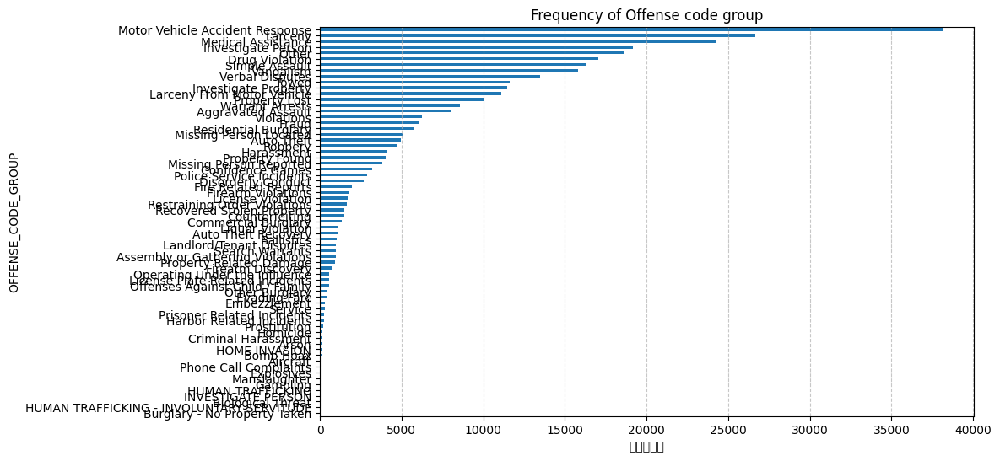

In [258]:
offense_codes_group_sorted = df2["OFFENSE_CODE_GROUP"].value_counts()
plt.figure(figsize=(10, 6))
offense_codes_group_sorted.plot(kind='barh')  # แนวนอน
plt.gca().invert_yaxis()  # ให้มากสุดอยู่บน
plt.xlabel('จำนวน')
plt.title('Frequency of Offense code group')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

 The 20 Most Crime-Happening Streets in Boston

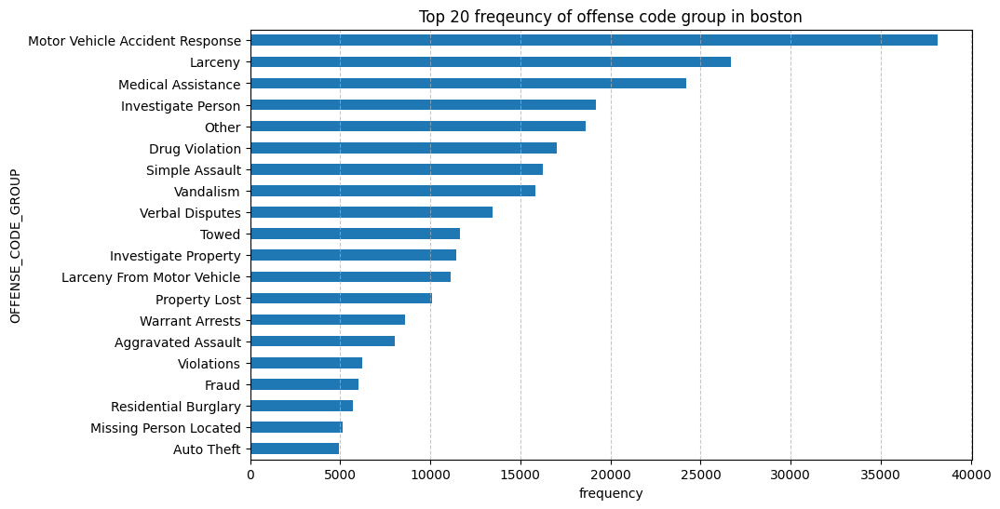

In [259]:
plt.figure(figsize=(10, 6))
offense_codes_group_sorted.head(20).plot(kind='barh')
plt.gca().invert_yaxis()
plt.xlabel('frequency')
plt.title('Top 20 freqeuncy of offense code group in boston')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

How many police districts are there?

In [260]:
district_unique = df2.DISTRICT.nunique()
print("Number of unique values in DISTRICT: {}".format(district_unique))
print("\n")
df2.DISTRICT.unique()

Number of unique values in DISTRICT: 12




array(['E18', 'D14', 'B2', 'A1', 'A7', 'C11', nan, 'D4', 'E13', 'B3',
       'C6', 'A15', 'E5'], dtype=object)

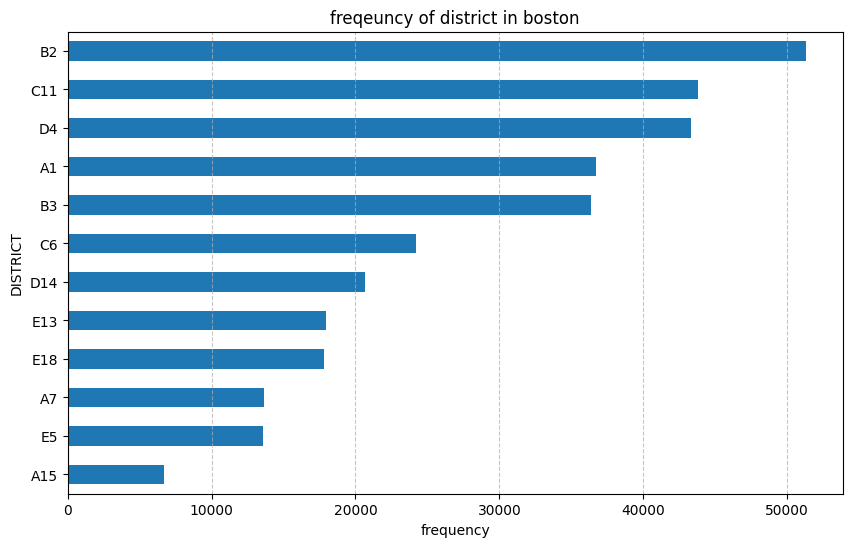

In [261]:
district_freq = df2["DISTRICT"].value_counts()
plt.figure(figsize=(10, 6))
district_freq.plot(kind='barh')
plt.gca().invert_yaxis()
plt.xlabel('frequency')
plt.title('freqeuncy of district in boston')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

What happens the most in Police District B2?

Text(0.5, 1.0, 'Frequency of Offense code group in Police District B2')

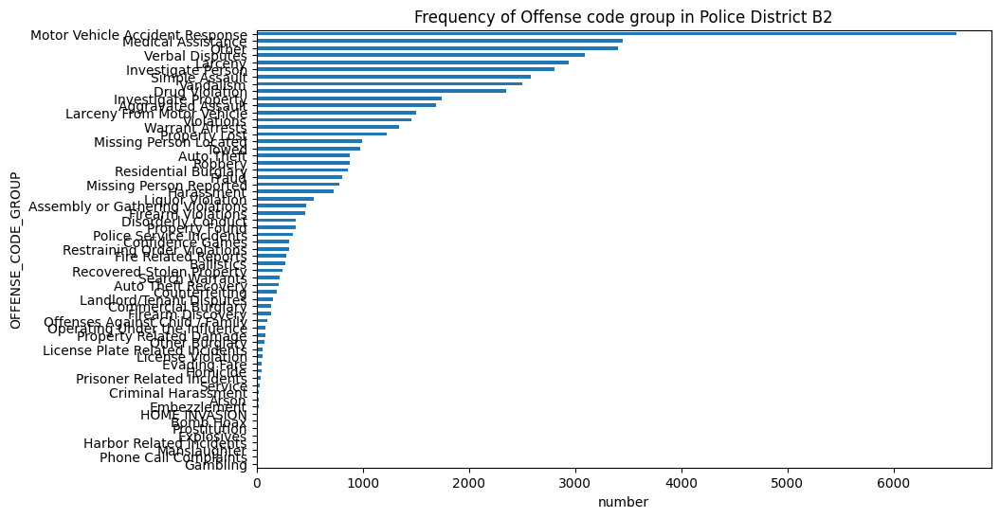

In [262]:
b2 = df2[df2['DISTRICT'] == 'B2']
offense_codes_group_sorted = b2["OFFENSE_CODE_GROUP"].value_counts()
plt.figure(figsize=(10, 6))
offense_codes_group_sorted.plot(kind='barh')
plt.gca().invert_yaxis()
plt.xlabel('number')
plt.title('Frequency of Offense code group in Police District B2')



> Displaying the frequency of crime types in Boston, divided into three categories as follows:
>
> **1. UCR Part I**
> Meaning: Comprises highly violent crimes considered major offenses that impact public safety.
> Types of crimes:
>
> * Murder
> * Rape
> * Robbery
> * Burglary
> * Theft
> * Aggravated Assault
> * Arson
>
> **2. UCR Part II**
> Meaning: Consists of less violent crimes but still impactful to society.
> Types of crimes:
>
> * Driving Under the Influence
> * Drug Offenses
> * Disorderly Conduct
> * Sex Offenses
> * Simple Assault
>
> **3. UCR Part III**
> Meaning: Includes crimes and offenses not covered in Part I and Part II, which may be more diverse.
> Types of crimes:
>
> * Fraud
> * Vandalism
> * Simple Assault
> * Economic crimes, such as Forgery


Which UCR\_PART occurs most frequently in the city of Boston?


Text(0.5, 1.0, 'Frequency UCR_PART in Boston city')

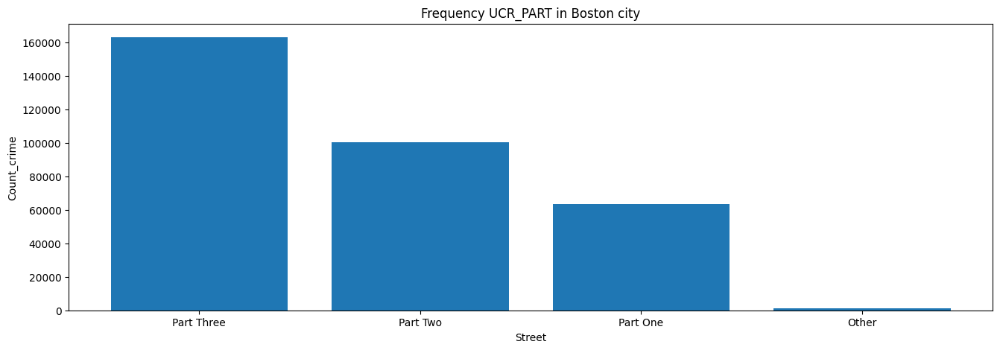

In [263]:
ucr_count = df2['UCR_PART'].value_counts().reset_index()
ucr_count.columns = ['UCR_PART', 'Count']
plt.figure(figsize=(16,5), dpi=100)
plt.bar(ucr_count['UCR_PART'], ucr_count['Count'])
plt.xlabel('Street')
plt.ylabel('Count_crime')
plt.title('Frequency UCR_PART in Boston city')

Top 10 cities with the highest occurrence of UCR in each PART

In [264]:
ucr1 = df2[df2['UCR_PART'] == "Part One"]
street_ucr1_count = ucr1["STREET"].value_counts()

ucr2 = df2[df2['UCR_PART'] == "Part Two"]
street_ucr2_count = ucr2["STREET"].value_counts()

ucr3 = df2[df2['UCR_PART'] == "Part Three"]
street_ucr3_count = ucr3["STREET"].value_counts()

df_ucr1 = street_ucr1_count.head(10).reset_index()
df_ucr2 = street_ucr2_count.head(10).reset_index()
df_ucr3 = street_ucr3_count.head(10).reset_index()

df_ucr1.columns = ['STREET_UCR1', 'COUNT_UCR1']
df_ucr2.columns = ['STREET_UCR2', 'COUNT_UCR2']
df_ucr3.columns = ['STREET_UCR3', 'COUNT_UCR3']

df_compare = pd.concat([df_ucr1, df_ucr2, df_ucr3], axis=1)

df_compare


,STREET_UCR1,COUNT_UCR1,STREET_UCR2,COUNT_UCR2,STREET_UCR3,COUNT_UCR3
0,WASHINGTON ST,3264,WASHINGTON ST,5138,WASHINGTON ST,6155
1,BOYLSTON ST,2809,BLUE HILL AVE,2820,BLUE HILL AVE,3744
2,BLUE HILL AVE,1406,BOYLSTON ST,2171,DORCHESTER AVE,2485
3,HUNTINGTON AVE,1145,HARRISON AVE,1894,BOYLSTON ST,2432
4,MASSACHUSETTS AVE,1118,DORCHESTER AVE,1770,COMMONWEALTH AVE,2322
5,TREMONT ST,1112,TREMONT ST,1656,CENTRE ST,2273
6,NEWBURY ST,1064,MASSACHUSETTS AVE,1630,TREMONT ST,2148
7,DORCHESTER AVE,1020,CENTRE ST,1443,MASSACHUSETTS AVE,2089
8,COMMONWEALTH AVE,972,COLUMBIA RD,1077,HYDE PARK AVE,2041
9,HARRISON AVE,877,HYDE PARK AVE,1070,HARRISON AVE,1959


In [265]:
# Plot Heat Map for OFFENSE_CODE_GROUP
from folium.plugins import HeatMap
df_crime_geo = df2[['Lat', 'Long']].dropna()
boston_map = folium.Map(location=[42.3601, -71.0589], zoom_start=12)
HeatMap(data=df_crime_geo[['Lat', 'Long']].values, radius=10).add_to(boston_map)
boston_map
# figure in figure/figure1.png

In which area of Boston do most Larceny?

In [266]:
crime_type = "Larceny"
df_crime = df2[df2['OFFENSE_CODE_GROUP'] == crime_type]
df_crime_geo = df_crime[['Lat', 'Long']].dropna()
boston_map = folium.Map(location=[42.3601, -71.0589], zoom_start=12)
HeatMap(data=df_crime_geo[['Lat', 'Long']].values, radius=10).add_to(boston_map)
boston_map
# figure in figure/figure2.png

How many streets are there in Boston?

In [267]:
st = df2['STREET'].drop_duplicates()
print("์Number of street in Bostin is {} ".format(len(st)))
st

์Number of street in Bostin is 4685 


,STREET
0,ARLINGTON ST
1,ALLSTON ST
2,DEVON ST
3,CAMBRIDGE ST
4,PRESCOTT ST
...,...
327082,HAMILTON
327309,FINANCIAL CTR
327346,NEWCOMB
327622,MT PLEASANT AVE


**Top 20 Which street has the most crime?**

<Figure size 1000x600 with 0 Axes>

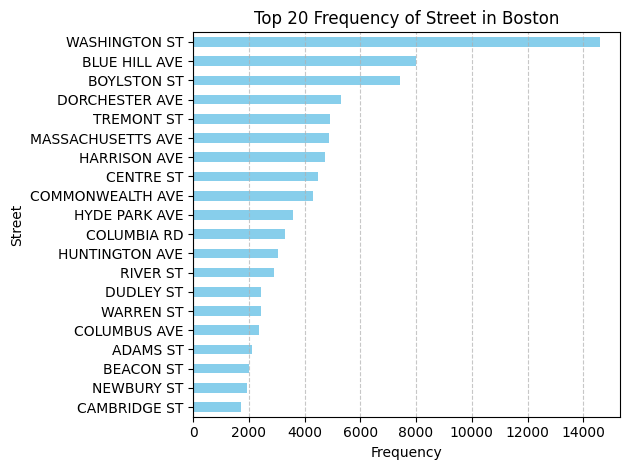

In [268]:
street_count = df2['STREET'].value_counts().reset_index()
street_count.columns = ['STREET', 'Count']

plt.figure(figsize=(10, 6))
street_count.head(20).plot(
    kind='barh',
    x='STREET',
    y='Count',
    color='skyblue',
    legend=False
)

plt.gca().invert_yaxis()
plt.xlabel('Frequency')
plt.ylabel('Street')
plt.title('Top 20 Frequency of Street in Boston')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


**What crimes are most common on LINCOLN STREET?**

In [269]:
lincoln_street = df2[df2['STREET'] == 'LINCOLN ST']
lincoln_street_count = lincoln_street['OFFENSE_CODE_GROUP'].value_counts().reset_index()
lincoln_street_count.columns = ['OFFENSE_CODE_GROUP', 'COUNT']
lincoln_street_count.head(10)

,OFFENSE_CODE_GROUP,COUNT
0,Motor Vehicle Accident Response,46
1,Vandalism,42
2,Larceny,40
3,Larceny From Motor Vehicle,34
4,Other,28
5,Investigate Person,28
6,Simple Assault,21
7,Medical Assistance,20
8,Drug Violation,17
9,Aggravated Assault,14


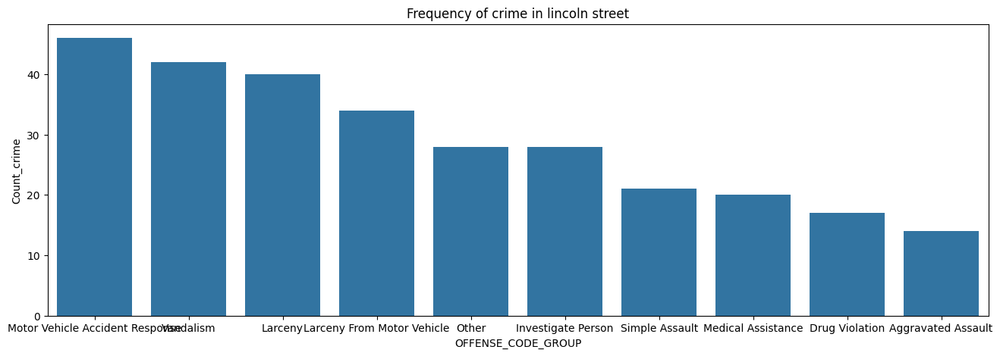

In [270]:
plt.figure(figsize=(16,5), dpi=100)
sns.barplot(data = lincoln_street_count[:10], x = "OFFENSE_CODE_GROUP", y = "COUNT")
plt.xlabel('OFFENSE_CODE_GROUP')
plt.ylabel('Count_crime')
plt.title('Frequency of crime in lincoln street')
plt.show()

Which day and time have the highest crime occurrence?

In [271]:
HOUR_counts = df2['HOUR'].value_counts().reset_index()
HOUR_counts.columns = ['HOUR', 'COUNT']
HOUR_counts['HOUR'] = HOUR_counts['HOUR'].astype(int)
HOUR_counts.sort_values("HOUR")

,HOUR,COUNT
11,0,15534
17,1,9502
19,2,7895
21,3,4710
22,4,3505
23,5,3409
20,6,5174
18,7,9095
14,8,13441
12,9,15157


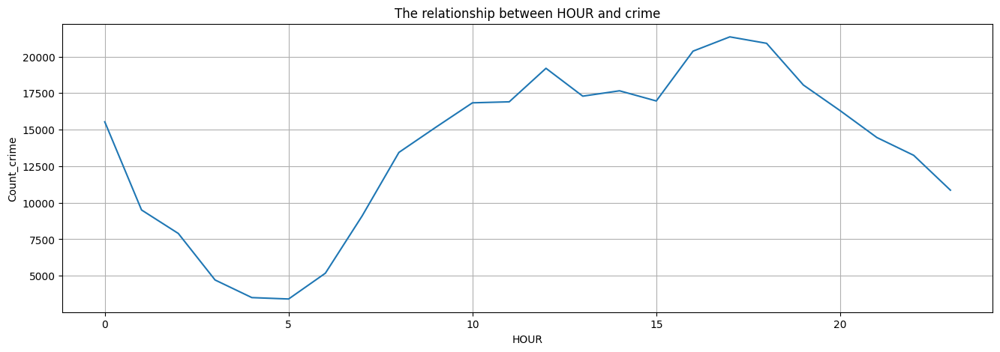

In [272]:
plt.figure(figsize=(16,5), dpi=100)
sns.lineplot(data=HOUR_counts, x="HOUR", y="COUNT")
plt.xlabel('HOUR')
plt.ylabel('Count_crime')
plt.title('The relationship between HOUR and crime')
plt.grid()
plt.show()

from the visualization of the relationship between time and crime rate, it can be observed that the crime rate noticeably increases after noon.

In [273]:
df2['PERIOD'] = df2['HOUR'].apply(lambda x: 'Night' if (x >= 18 or x < 6) else 'Day')
period_counts = df2['PERIOD'].value_counts()
period_counts

,count
PERIOD,
Day,189442
Night,138378


**Does crime tend to occur more at night compared to daytime?**
Hypotheses:

---


𝐻0 : Crime occurs equally during the daytime and nighttime.

---


𝐻1 : Crime occurs more during the nighttime than the daytime.

In [274]:
from scipy.stats import ttest_ind

day_hours = df2[df2['PERIOD'] == 'Day'].groupby('HOUR').size()
night_hours = df2[df2['PERIOD'] == 'Night'].groupby('HOUR').size()

t_stat, p = ttest_ind(day_hours, night_hours, equal_var=False)
print(f"t-statistic: {t_stat:.2f}, p-value: {p:.4f}")

t-statistic: 1.98, p-value: 0.0614


Conclusion:
Since the
𝑝
p-value (0.0614) is greater than the typical significance level of 0.05, we fail to reject the null hypothesis.
→ There is not enough evidence to conclude that crime occurs more at night compared to daytime.

In [275]:
day_counts_df = df2["DAY_OF_WEEK"].value_counts().reset_index()
day_counts_df.columns = ['DAY_OF_WEEK', 'COUNT']
day_counts_df

,DAY_OF_WEEK,COUNT
0,Friday,49758
1,Wednesday,48151
2,Thursday,47872
3,Tuesday,47726
4,Monday,46970
5,Saturday,45969
6,Sunday,41374


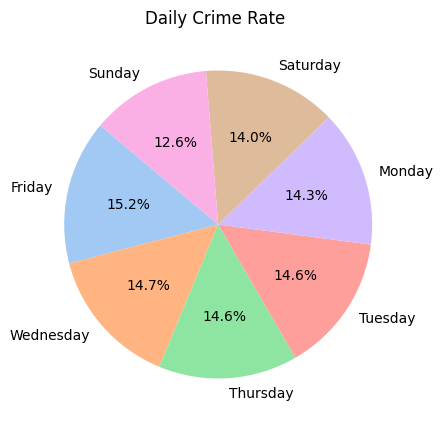

In [276]:
plt.figure(figsize=(16,5))
plt.pie(day_counts_df['COUNT'],
    labels=day_counts_df["DAY_OF_WEEK"],
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("pastel")
)

plt.title("Daily Crime Rate ")
plt.show()

Does the day of the week affect the type of crime? test by Chi-squared test

🔷 Hypotheses:

𝐻0: The day of the week and the type of crime are independent of each other.
(There is no relationship between the day of the week and the type of crime.)

𝐻1: The day of the week and the type of crime are not independent.
(There is a relationship between the day of the week and the type of crime.)

In [277]:
from scipy.stats import chi2_contingency

# contingency table
table = pd.crosstab(df2['DAY_OF_WEEK'], df2['UCR_PART'])

# chi-squared test
chi2, p, dof, expected = chi2_contingency(table)

print(f"Chi² statistic: {chi2:.2f}")
print(f"Degrees of freedom: {dof}")
print(f"p-value: {p:.4f}")


Chi² statistic: 232.67
Degrees of freedom: 18
p-value: 0.0000


Conclusion:
Since the
𝑝
p-value is less than 0.05, we reject the null hypothesis.
→ There is a statistically significant association between the day of the week and the type of crime.
→ This indicates that the type of crime varies significantly depending on the day of the week.

What time and day of the day do crimes occur most often?

/tmp/ipython-input-278-3124934870.py:7: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



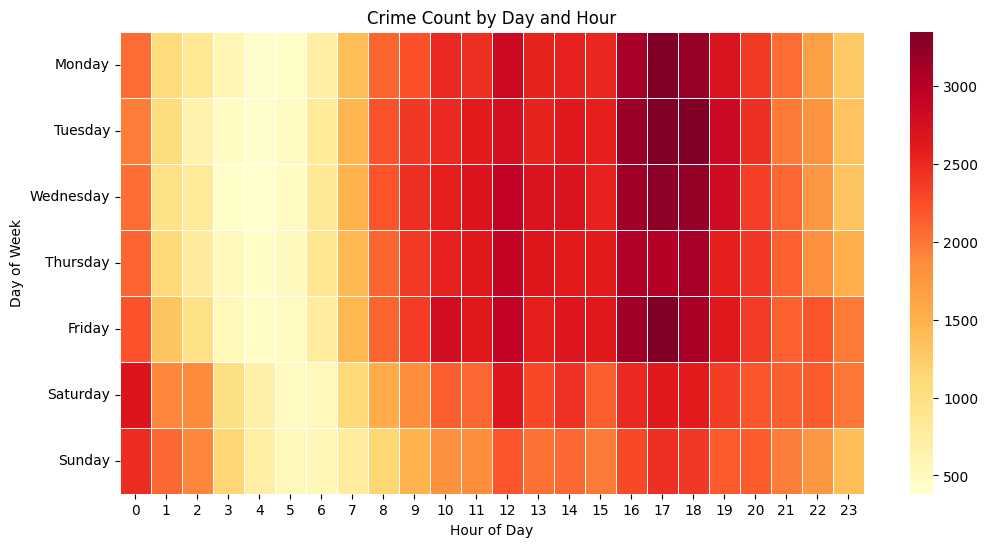

In [278]:
day_freq = df2[['DAY_OF_WEEK', 'HOUR']].value_counts().reset_index()
day_freq.columns = ['DAY_OF_WEEK', 'HOUR', 'Count']
day_freq['HOUR'] = day_freq['HOUR'].astype(int)
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_freq['DAY_OF_WEEK'] = pd.Categorical(day_freq['DAY_OF_WEEK'], categories=day_order, ordered=True)

pivot_table = day_freq.pivot_table(index='DAY_OF_WEEK', columns='HOUR', values='Count', fill_value=0)
plt.figure(figsize=(12,6))
sns.heatmap(pivot_table, cmap="YlOrRd", linewidths=0.5)
plt.title("Crime Count by Day and Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.show()


From the scatter plot and heatmap, it is noticeable that crime rates start to increase from 10 AM onwards.


What factors are related to the occurrence of crime in the city of Boston?


In [279]:
crim_corr = df.corr()["crim"]
crim_corr.sort_values(ascending=False)

,crim
crim,1.000000
rad,0.625505
tax,0.582764
lstat,0.455621
nox,0.420972
indus,0.406583
age,0.352734
ptratio,0.289946
chas,-0.055892
zn,-0.200469


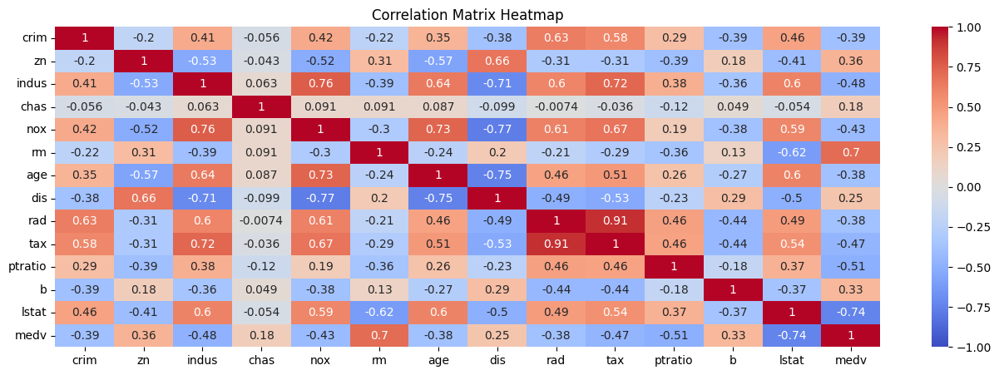

In [280]:
import seaborn as sns
correlation_matrix = df.corr()
plt.figure(figsize=(16, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

Areas with high crime rates (crim) tend to be near main roads (rad), in industrial zones with high pollution, poor communities, old buildings, low house prices, far from good residential zones, and distant from natural areas. Areas with low crime rates (crim) usually have large houses, high house prices, stable communities, and are far from industrial zones.


In [281]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objs as go
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
Scene = dict(xaxis = dict(title  = 'crim'),yaxis = dict(title  = 'dis'),zaxis = dict(title  = 'tax'))

# Select features for clustering
features = ['crim', 'rad', 'tax']
X = df[features].dropna()

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10) # You can adjust the number of clusters
kmeans.fit(X_scaled)

labels = kmeans.labels_

# Add the cluster labels back to the original dataframe (only for rows used in clustering)
X['cluster'] = labels

# Create the 3D scatter plot using plotly
fig = px.scatter_3d(X, x='crim', y='rad', z='tax', color='cluster',
                    title='3D Scatter Plot of Crime Rate, Distance to Employment Centers, and Tax colored by KMeans Clusters')

fig.update_layout(scene = Scene)

fig.show()

Shows the relationship between proximity to major roads and crime rates.

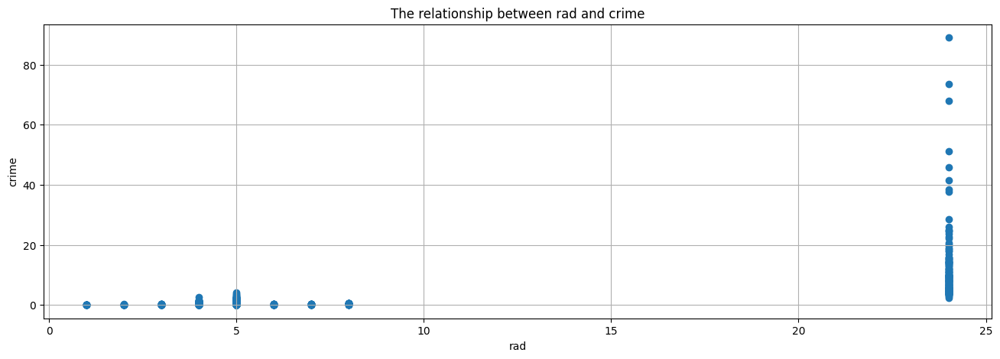

In [282]:
plt.figure(figsize=(16,5), dpi=100)
plt.scatter(df['rad'], df['crim'])
plt.title('The relationship between rad and crime')
plt.xlabel('rad')
plt.ylabel('crime')
plt.grid()
plt.show()

Many cities with greater distances between the city center and main roads tend to have higher crime rates.


Show the relationship between the tax rate and the crime rate.


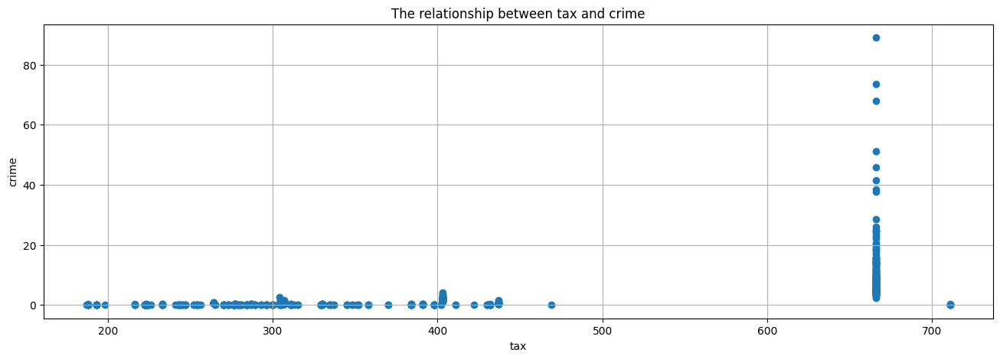

In [283]:
plt.figure(figsize=(16,5), dpi=100)
plt.scatter(df['tax'], df['crim'])
plt.title('The relationship between tax and crime')
plt.xlabel('tax')
plt.ylabel('crime')
plt.grid()
plt.show()

Many cities with high tax rates also tend to have higher crime rates.


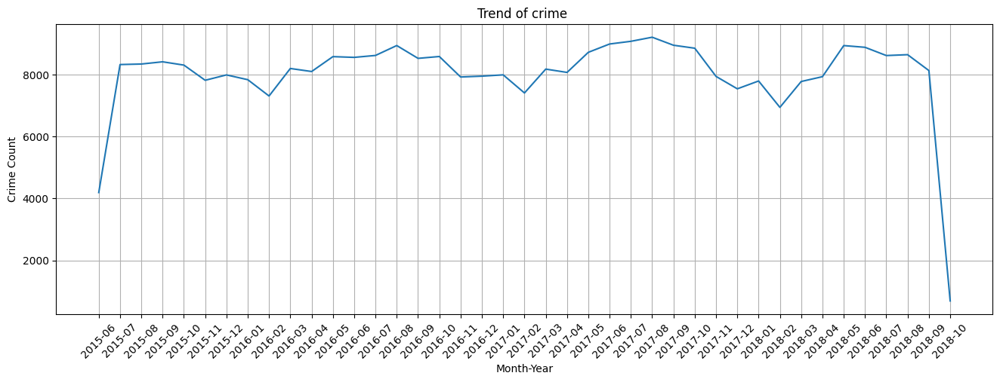

In [284]:
dy = pd.to_datetime(df2['OCCURRED_ON_DATE']).reset_index()

dy_counts = (dy['OCCURRED_ON_DATE'].dt.to_period('M').value_counts().reset_index())

dy_counts.columns = ['month_year', 'Count']

dy_counts = dy_counts.sort_values('month_year')
dy_counts['month_year'] = dy_counts['month_year'].astype(str)

plt.figure(figsize=(16,5), dpi=100)
sns.lineplot(data=dy_counts, x='month_year', y='Count')
plt.xlabel('Month-Year')
plt.ylabel('Crime Count')
plt.title('Trend of crime ')
plt.xticks(rotation=45)
plt.grid()
plt.show()

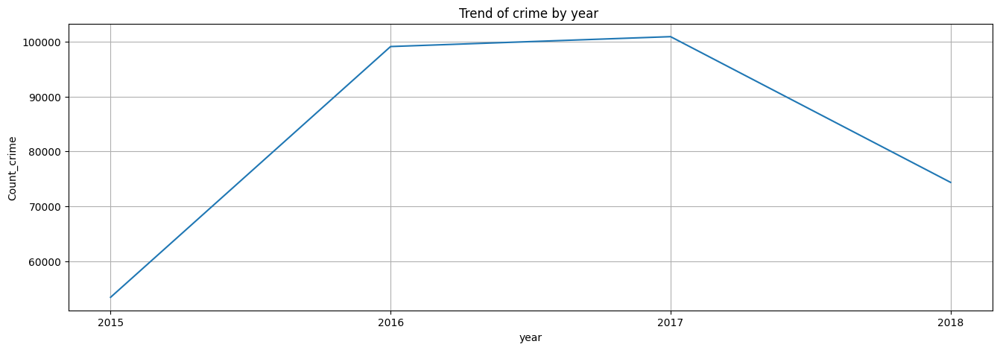

In [285]:
y_counts = dy['OCCURRED_ON_DATE'].dt.to_period('Y').value_counts().reset_index()
y_counts.columns = ['year', 'Count']
y_counts['month_year'] = y_counts['year'].astype(str)
y_counts = y_counts.sort_values('year',ascending=True)
plt.figure(figsize=(16,5), dpi=100)
sns.lineplot(data = y_counts, x = "month_year", y = "Count")
plt.xlabel('year')
plt.ylabel('Count_crime')
plt.title('Trend of crime by year ')
plt.grid()
plt.show()